In [4]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

In [5]:

df = pd.read_csv(r'Dataset\\training_data.csv', encoding='latin1')
df.drop('Unnamed: 133', axis=1, inplace=True)

df.describe()

,itching,skin_rash,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,ulcers_on_tongue,...,pus_filled_pimples,blackheads,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze
count,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,...,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000
mean,0.137805,0.159756,0.021951,0.045122,0.021951,0.162195,0.139024,0.045122,0.045122,0.021951,...,0.021951,0.021951,0.021951,0.023171,0.023171,0.023171,0.023171,0.023171,0.023171,0.023171
std,0.344730,0.366417,0.146539,0.207593,0.146539,0.368667,0.346007,0.207593,0.207593,0.146539,...,0.146539,0.146539,0.146539,0.150461,0.150461,0.150461,0.150461,0.150461,0.150461,0.150461
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [12]:
# Check for missing values
missing_values = df.isnull().sum()

# Print the columns with missing values
print("Columns with missing values:")
print(missing_values[missing_values > 0])



Columns with missing values:
Series([], dtype: int64)


In [6]:
import matplotlib.pyplot as plt

df2=pd.read_csv(r'Dataset\cleaned_data.csv', encoding='latin1')
df1=df2[['disease','occurrence_count']]
df1 = df1.drop_duplicates(subset='disease')
plt.figure(figsize=(100, 80))
#plt.subplots(figsize=(10, 10))
plt.pie(df1['occurrence_count'], labels=df1['disease'], autopct='%1.1f%%', shadow=True, startangle=90)
#percentages = [autotext.get_text() for autotext in autotexts]
#labels = [f'{disease} ({percentage})' for disease, percentage in zip(df['disease'], percentages)]

plt.title('Prognosis Distribution', fontsize=50, fontweight='bold')
plt.legend( df1['disease'], loc='best', fontsize=30)
plt.axis('equal')

plt.show()

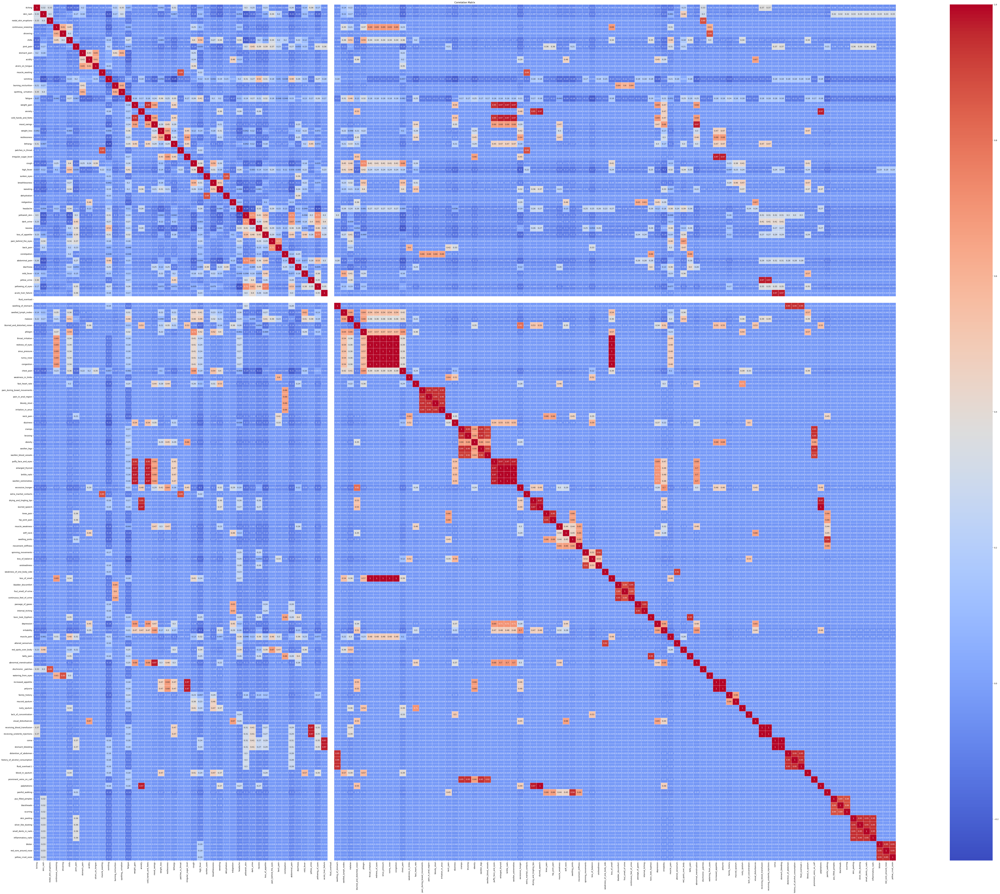

In [7]:
df_numerical = df.select_dtypes(include='number')
correlation_matrix = df_numerical.corr()

# Plotting with Seaborn
plt.figure(figsize=(100, 80))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Matrix')
plt.show()

In [8]:
df['prognosis'].value_counts()

prognosis
Fungal infection                           120
Hepatitis C                                120
Hepatitis E                                120
Alcoholic hepatitis                        120
Tuberculosis                               120
Common Cold                                120
Pneumonia                                  120
Dimorphic hemmorhoids(piles)               120
Heart attack                               120
Varicose veins                             120
Hypothyroidism                             120
Hyperthyroidism                            120
Hypoglycemia                               120
Osteoarthristis                            120
Arthritis                                  120
(vertigo) Paroymsal  Positional Vertigo    120
Acne                                       120
Urinary tract infection                    120
Psoriasis                                  120
Hepatitis D                                120
Hepatitis B                                120
All

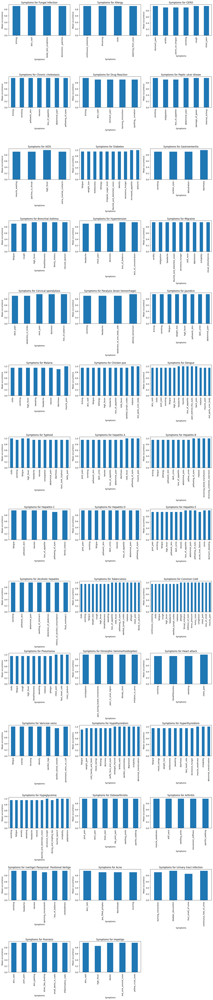

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import math
import os

# Load the dataset
data_path = "Dataset\\training_data.csv"
data = pd.read_csv(data_path)

# Ensure the prognosis column is correctly formatted
data['prognosis'] = data['prognosis'].astype('category')

# List of unique diseases
diseases = data['prognosis'].unique()

# Number of subplots
num_diseases = len(diseases)
cols = 3  # Number of columns in the subplot grid
rows = math.ceil(num_diseases / cols)  # Number of rows in the subplot grid

# Create subplots
fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))
fig.subplots_adjust(hspace=0.5, wspace=0.5)

# Generate bar plots for each disease
for idx, disease in enumerate(diseases):
    # Filter rows where the disease is present
    disease_data = data[data['prognosis'] == disease]
    
    # Drop the prognosis column and calculate the mean of each symptom
    mean_symptoms = disease_data.drop(columns=['prognosis']).mean()
    
    # Filter symptoms with non-zero mean
    mean_symptoms = mean_symptoms[mean_symptoms > 0]
    
    # Determine the position of the subplot
    row = idx // cols
    col = idx % cols
    
    # Plot the bar chart
    ax = axs[row, col] if num_diseases > 1 else axs
    mean_symptoms.plot(kind='bar', ax=ax)
    ax.set_title(f'Symptoms for {disease}')
    ax.set_xlabel('Symptoms')
    ax.set_ylabel('Mean occurrence')
    ax.tick_params(axis='x', rotation=90)

# Hide empty subplots if any
for i in range(num_diseases, rows * cols):
    fig.delaxes(axs.flatten()[i])

plt.tight_layout()

# Save the figure
output_dir = "Disease_Plots"
os.makedirs(output_dir, exist_ok=True)
plt.savefig(os.path.join(output_dir, "disease_symptoms_subplots.png"))
plt.show()

In [10]:
import pandas as pd
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import math

# Load the dataset
data = pd.read_csv('Dataset\\training_data.csv')

# Get the list of symptoms (features) excluding the 'prognosis' column
symptoms = data.columns[:-1]

# Map encoded prognosis back to disease names
data['prognosis'] = data['prognosis'].astype('category')
prognosis_mapping = dict(enumerate(data['prognosis'].cat.categories))
data['prognosis'] = data['prognosis'].cat.codes

# Calculate the number of rows and columns for subplots
num_symptoms = len(symptoms)
num_cols = 3
num_rows = math.ceil(num_symptoms / num_cols)

# Create subplots
fig = make_subplots(rows=num_rows, cols=num_cols, subplot_titles=symptoms)

# Plot for each symptom
for i, symptom in enumerate(symptoms):
    # Filter data for the current symptom
    symptom_data = data[data[symptom] == 1]
    
    # Get the count of each disease caused by the current symptom
    disease_counts = symptom_data['prognosis'].value_counts()
    
    # Map encoded prognosis back to disease names
    disease_counts.index = disease_counts.index.map(prognosis_mapping)
    
    # Add bar plot to the corresponding subplot
    row = (i // num_cols) + 1
    col = (i % num_cols) + 1
    
    fig.add_trace(go.Bar(x=disease_counts.index, y=disease_counts.values, name=symptom),
                  row=row, col=col)

# Update layout
fig.update_layout(height=num_rows * 400, title_text="Symptoms and Associated Diseases", showlegend=False)

# Update x-axis labels
for i in range(1, num_rows*num_cols + 1):
    fig['layout'][f'xaxis{i}']['tickangle'] = -90

# Show plot
fig.show()


In [15]:
import pandas as pd
import plotly.express as px

# Load the dataset
file_path = 'Dataset/training_data.csv'
data = pd.read_csv(file_path)

# Drop the unnamed column
data_cleaned = data.drop(columns=['Unnamed: 133'], errors='ignore')

# Sum the occurrences of each symptom
symptom_counts = data_cleaned.drop(columns=['prognosis'], errors='ignore').sum().sort_values(ascending=False)

# Create a bar plot
fig = px.bar(symptom_counts, x=symptom_counts.index, y=symptom_counts.values, 
             labels={'x': 'Symptom', 'y': 'Count'}, title='Count of Each Symptom')
fig.update_layout(xaxis_title='Symptom', yaxis_title='Count', xaxis_tickangle=-45)

# Show the plot
fig.show()
